In [1]:
import re, os, sys

import numpy as np
import pandas as pd
import torch
from PIL import Image

from preprocess import *

In [2]:
## codes below are for debugging preprocess.py
model_checkpoint = "koclip/koclip-base-pt"
processor = AutoProcessor.from_pretrained(model_checkpoint)
model = AutoModel.from_pretrained(model_checkpoint)

# paths
paths = {
    ## dataset & image path
    "train_path": "/kovar-vol/kovar/dataset/train.json",
    "test_path": "/kovar-vol/kovar/dataset/test.json",
    "image_path": "/kovar-vol/images",
}

In [3]:
get_dataset = JsonToDataset()
train_set = get_dataset(paths['test_path'])
len(train_set)

1216

In [4]:
def display_img(image_path):
    img = Image.open(image_path)
    img = ImageOps.exif_transpose(img)
    display(img)

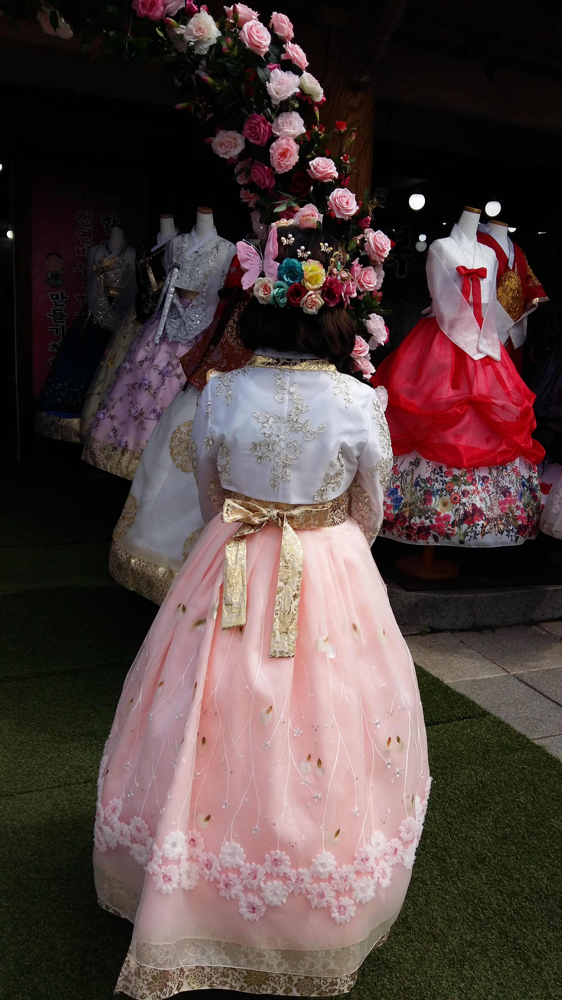

['한 사람이 한복 대여점에서 한복을 구경하고 있었다.[SEP]그리고 한복을 하나 골라서 택배로 부쳤다.[SEP]그 결과 직원은 그 사람에게 그 한복이 참 잘어울린다고 얘기했다.',
 '한 사람이 한복 대여점에서 한복을 구경하고 있었다.[SEP]그리고 한복을 하나 골라서 직접 입어 보았다.[SEP]그 결과 직원은 그 사람에게 그 한복이 참 잘어울린다고 얘기했다.',
 '한 사람이 한복 대여점에서 한복을 구경하고 있었다.[SEP]그리고 나는 원작자의 허락을 받고 개작한 소설을 출간했다.[SEP]그 결과 직원은 그 사람에게 그 한복이 참 잘어울린다고 얘기했다.']

In [6]:
sample = train_set[150]

display_img(sample['image_path'])
sample['input_prompt']

- 바닐라: 388/1216
- 문두에 cls 토큰 추가: 387/1216
- 이미지 트랜스폼
    - 리사이즈 & 노말라이즈: 337/1216
    - 정규화만: 388/1216

<br>

- 프롬프트 엔지니어링
    - NSP(obs1. 그 이후 obs2. 그 이유는 hypN했기 때문이다.): 396/1216
    - MLM(obs1. 그리고 hypN. 그 결과 obs2): 389/1216
    